In [1]:
import pandas as pd
import os
import io
from contextlib import redirect_stdout
import earthpy as et
import earthpy.plot as ep
import pynhd as nhd
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np
import py3dep
import pygeoogc.utils as ogc_utils
from pynhd import NHD, NLDI
import xarray as xr
import rioxarray as rxr
import ee
import geemap
import gc
from rasterio.enums import Resampling
from rasterio.plot import plotting_extent
import time

data_dir = os.path.join(et.io.HOME, "GitHub", "LakeCarbon")

In [2]:
lake_meta = pd.read_csv(os.path.join(data_dir, "LakeMeta.csv"))

In [3]:
ee.Initialize()

In [4]:
def mask_na_val(val, arr):
    """
    Replace all occurrences of a given value in a NumPy array with NaN.

    Parameters:
    -----------
    val : scalar
        The value to be replaced.
    arr : numpy.ndarray
        The input NumPy array.

    Returns:
    --------
    result : numpy.ndarray
        A new NumPy array where all occurrences of the value 'val' in the input array 'arr'
        have been replaced with NaN.
    """
    return np.where(arr == val, np.nan, arr)

def make_point_lat_lon(lat, lon):
    # Make point gdf given lat lon
    point = Point(lon, lat)

    gdf = gpd.GeoDataFrame(
        {
            "upstream": [
                "True",
            ]
        },
        geometry=[point],
        crs="EPSG:4269",
    )
    
    return gdf

def get_catchment_lat_lon(lake_point):
    # Find the NHDPlus catchment for the given point
    trace = nhd.pygeoapi(lake_point, "split_catchment")
    return trace.drop(0).dissolve()


class LakeClass:
    def __init__(self,
                 lat,
                 lon,
                 name,
                 out_dir,
                 threshold=.4,
                 point=None,
                 lake_poly=None,
                 catchment=None,
                 point_buffer=None,
                 slope=None,
                 clean_slope=None,
                 dem=None,
                 gee_ndvi=None,
                 ndvi=None,
                 tree_cover=None,
                 tree_cover_noK=None,
                 veg_cover=None,
                 area=None,
                 percent_tree=None,
                 percent_tree_noK=None,
                 percent_veg=None,
                 tree_slope=None,
                 extent=None, 
                 catchment_reproj=None):

        self.lat = lat
        self.lon = lon
        self.name = name
        self.out_dir = out_dir
        self.threshold = threshold
        self.point = point
        self.lake_poly = lake_poly
        self.catchment = catchment
        self.point_buffer = point_buffer
        self.slope = slope
        self.clean_slope = clean_slope
        self.dem = dem
        self.gee_ndvi = gee_ndvi
        self.ndvi = ndvi
        self.area = area
        self.extent = extent
        self.tree_cover = tree_cover
        self.tree_cover_noK = tree_cover_noK
        self.veg_cover = veg_cover
        self.percent_tree = percent_tree
        self.percent_tree_noK = percent_tree_noK
        self.percent_veg = percent_veg
        self.catchment_reproj = catchment_reproj
        self.tree_slope = tree_slope

    def get_lake_point(self):
        """
        Calculates the point for a given lake location using its latitude and longitude.
        """

        # Create a point object using the lake's coordinates
        point = Point(self.lon, self.lat)

        # Create a GeoDataFrame containing the point from the lake data
        point_gdf = gpd.GeoDataFrame(
            {"upstream":
                ["True"]
             },
            geometry=[point],
            crs="EPSG:4269")

        # Add a new column to the GeoDataFrame containing the lake name
        point_gdf["Name"] = self.name

        self.point = point_gdf
        
    def make_point_buffer(self):
        # Make a buffered point for areas where the lake geometry doesn't line up with the point exactly
        point_buffer = self.point.copy()
        point_buffer.geometry = point_buffer.to_crs("EPSG:26913").buffer(30).to_crs("EPSG:4269")
        self.point_buffer = point_buffer
        
    def get_catchment_polygon(self, lake_gdf):
        # Find polygon of lake that point is with
        lake_poly = gpd.overlay(self.point, lake_gdf, "intersection")
        if len(lake_poly) == 0:
            lake_poly = gpd.overlay(self.point_buffer, lake_gdf, "intersection")
            if len(lake_poly) == 0:
                print(self.name, "No polygon still")
                self.lake_poly = None
                self.catchment = get_catchment_lat_lon(self.point)
        if type(lake_poly) == gpd.GeoDataFrame:
            self.lake_poly = lake_poly.Lake_geom.values[0]
            lake_points = list(zip(*self.lake_poly.exterior.coords.xy))
            lake_catchments = []

            for points in lake_points:
                time.sleep(.1)
                point = make_point_lat_lon(points[1], points[0])
                lake_catchments.append(get_catchment_lat_lon(point))

            self.catchment = pd.concat(lake_catchments).dissolve()

    def get_slope(self):
        """
        Calculate the slope of a given catchment using Py3DEP.
        """
        self.slope = py3dep.get_map(
            "Slope Degrees", self.catchment.geometry.loc[0], 30, geo_crs=self.catchment.crs)

    def make_clean_slope(self):
        """
        Mask the NA values from the slope raster
        """
        self.clean_slope = mask_na_val(255, self.slope)

    def get_dem(self):
        """
        Calculate the DEM of a given catchment using Py3DEP.
        """
        self.dem = py3dep.get_map(
            "DEM", self.catchment.geometry.loc[0], 30, geo_crs=self.catchment.crs)

    def get_NDVI_gee(self):
        """
        Calculate Normalized Difference Vegetation Index (NDVI) for a given point 
        within a catchment using Google Earth Engine.        
        """
        # Extract x and y coordinates from the input GeoDataFrame for the given point
        x, y = self.point.geometry.x.values[0], self.point.geometry.y.values[0]
        # Initialize an ImageCollection object with the desired Landsat dataset
        l8 = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA')

        # Create an earth engine point geometry using the extracted x and y coordinates
        gee_point = ee.Geometry.Point([x, y])

        # Filter the Landsat ImageCollection by the point geometry, date range and sort by cloud cover
        # Select the first image (the one with the least cloud cover)
        image = ee.Image(
            l8.filterBounds(gee_point)
            .filterDate('2022-07-15', '2022-09-15')
            .sort('CLOUD_COVER')
            .first()
        )
        # Calculate NDVI from the selected image, rename the resulting image to 'NDVI'
        ndvi = image.normalizedDifference(['B5', 'B4']).rename('NDVI')

        # Get the bounding box of the given catchment and create a bounding box geometry object
        bounds = list(self.catchment.bounds.values[0])
        geomPoly = ee.Geometry.BBox(*bounds)

        # Clip the NDVI image to the bounding box of the given catchment and unmask the result
        self.gee_ndvi = (ndvi.clip(geomPoly).unmask())

    def export_open_gee(self):
        """
        Export an Earth Engine image to a GeoTIFF file and open it with RioXarray.

        """
        # set a trap and redirect stdout
        trap = io.StringIO()

        # Create a file name
        filename = os.path.join(
            self.out_dir, '{}_ndvi.tif'.format(self.name))

        # Get the bounding box coordinates of the catchment feature
        bounds = list(self.catchment.bounds.values[0])

        # If the exported file already exists, remove it
        if os.path.exists(filename):
            os.remove(filename)

        # Export the Earth Engine image to the GeoTIFF file
        with redirect_stdout(trap):
            geemap.ee_export_image(
                self.gee_ndvi, filename=filename, scale=30, region=bounds, file_per_band=False, crs="EPSG:4326"
            )

        # Open the exported GeoTIFF file into an xarray dataarray
        self.ndvi = rxr.open_rasterio(
            filename, mask=True).rio.clip(self.catchment.geometry)

    def get_polygon_area(self):
        """
        Get area of polygon in UTM13 and return in square meters
        """
        self.area = int(self.catchment_reproj.geometry.area.values[0])
        
    def make_extent(self):
        """
        Create an extent object for the lake from the slope array
        """
        self.extent = plotting_extent(self.slope.values, self.slope.rio.transform())
        
    def reproj_catchment(self):
        """
        Reproject the catchment to be in a geometric coordinate systems
        """
        self.catchment_reproj = self.catchment.to_crs('EPSG:26913')
        
    def get_lake_tree_cover(self, tree_cover, Krummholz=False):
        """
        Get the tree_cover and tree_cover_noK areas in each catchment
        """
        # Clip the tree data to the catchment
        clipped = tree_cover.clip(self.catchment_reproj)
        if not Krummholz:
            clipped = clipped[clipped.MapUnit_Na != 'Krummholz']
        dataframes = []
        total_veg = 0
        # Loop through the cover types found within each catchment
        for cover_type, data in clipped.groupby('MapUnit_Na'):
            # Create a geometry for the cover
            geo = data.dissolve().geometry
            # Get the total area of the cover type within the catchment
            area = geo.area.values[0]
            # Find the percent coverage of the cover type over the whole catchment
            percent_area = (area/self.area)*100
            total_veg += percent_area
            # Create a geodataframe for each cover
            gdf_input = {'cover_type': [cover_type], 'area': [area], 'catch_area': [self.area], 'perc_area': [percent_area]}
            dataframes.append(gpd.GeoDataFrame(gdf_input, geometry=geo.values, crs=clipped.crs))
        # Concat all cover geodataframes and assign to the matching variable. If no tree_cover areas then return None
        if not Krummholz:
            if len(dataframes) == 0:
                self.tree_cover = None
                self.percent_tree = total_veg
            else:
                self.tree_cover = pd.concat(dataframes)
                self.percent_tree = total_veg
        else:
            if len(dataframes) == 0:
                self.tree_cover_noK = None
                self.percent_tree_noK = total_veg
            else:
                self.tree_cover_noK = pd.concat(dataframes)
                self.percent_tree_noK = total_veg
    
    def get_lake_veg_cover(self, veg_cover):
        """
        Get the vegetable cover areas in each catchment
        """
        # Clip the tree data to the catchment
        clipped = veg_cover.clip(self.catchment_reproj)
        dataframes = []
        total_veg = 0
        # Loop through the cover types found within each catchment
        for cover_type, data in clipped.groupby('MapUnit_Na'):
            # Create a geometry for the cover
            geo = data.dissolve().geometry
            # Get the total area of the cover type within the catchment
            area = geo.area.values[0]
            # Find the percent coverage of the cover type over the whole catchment
            percent_area = (area/self.area)*100
            total_veg += percent_area
            # Create a geodataframe for each cover
            gdf_input = {'cover_type': [cover_type], 'area': [area], 'catch_area': [self.area], 'perc_area': [percent_area]}
            dataframes.append(gpd.GeoDataFrame(gdf_input, geometry=geo.values, crs=clipped.crs))
        # Concat all cover geodataframes and assign to the matching variable. If no tree_cover areas then return None
        if len(dataframes) == 0:
            self.veg_cover = None
            self.percent_veg = total_veg
        else:
            self.veg_cover = pd.concat(dataframes)
            self.percent_veg = total_veg
    
    def get_mean_tree_cover_slope(self):
        """
        Get the mean slope for the tree_cover areas in the catchment
        """
        if self.percent_tree != 0:
            tree_cover_reproj = self.tree_cover.to_crs(self.catchment.crs)
            tree_cover_clip = self.slope.rio.clip(tree_cover_reproj.geometry)
            tree_cover_slope = xr.where(tree_cover_clip == 255, 0, tree_cover_clip)
            self.tree_slope = tree_cover_slope.mean(skipna=True).values.item()
        else: 
            self.tree_slope = 0

In [5]:
# Create dictionary to store Lake objects
lake_dict = {}

out_dir = os.path.join(os.path.expanduser(
    '~'), 'GitHub', 'LakeCarbon', 'output')

# Open relevant datasets
lake_polys = gpd.read_file(os.path.join(data_dir, "data", "RMNP_Waterbodies", "RMNP_Waterbodies.shp"))
lake_polys['Lake_geom'] = lake_polys.geometry

tree_cover = gpd.read_file(os.path.join('data', 'Tree_Cover_Shapefile', 'Tree_Cover.shp'))
veg_cover = gpd.read_file(os.path.join('data', 'All_Veg_Shapefile', 'All_Veg.shp'))

In [6]:
# Loop through each lake in lake_meta
for i, center_point in lake_meta.iterrows():
    name = center_point.Lake
    print(f"Getting data for {name} ({i+1}/{len(lake_meta)})")

    # Create Lake object
    lake = LakeClass(center_point.Latitude,
                     center_point.Longitude,
                     name,
                     out_dir)

    # Get catchment and center point for lake
    lake.get_lake_point()
    lake.make_point_buffer()
    lake.get_catchment_polygon(lake_gdf = lake_polys)
    lake.reproj_catchment()

    # Get slope data
    lake.get_slope()
    lake.make_clean_slope()

    # Get DEM data
    lake.get_dem()

    # Get NDVI data and export to file
    # lake.get_NDVI_gee()
    # lake.export_open_gee()

    # Get area of catchment
    lake.get_polygon_area()

    # Get percent of catchment that has tree cover
    lake.get_lake_tree_cover(tree_cover)
    lake.get_lake_tree_cover(tree_cover, Krummholz=True)
    lake.get_lake_veg_cover(veg_cover)

    # Get the average slope of the tree cover areas
    lake.get_mean_tree_cover_slope()

    # Store lake in dictionary
    lake_dict[name] = lake

lake_list = list(lake_dict.values())

Getting data for Two Rivers Pond (1/18)
Getting data for Helene Lake (2/18)
Getting data for Green Lake (3/18)
Getting data for Snowbank Lake (4/18)
Getting data for Ptarmigan Tarn (5/18)
Getting data for Two Rivers Lake (6/18)
Getting data for Frozen Lake (7/18)
Getting data for Le Petite Tarn (8/18)
Getting data for Mills Lake (9/18)
Getting data for Lake Irene (10/18)
Getting data for Thunder Lake (11/18)
Getting data for Lake Verna (12/18)
Getting data for Poudre Lake (13/18)
Getting data for Black Lake (14/18)
Getting data for Odessa Lake (15/18)
Getting data for Fern Lake (16/18)
Getting data for Lion Lake II (17/18)
Getting data for Lone Pine Lake (18/18)


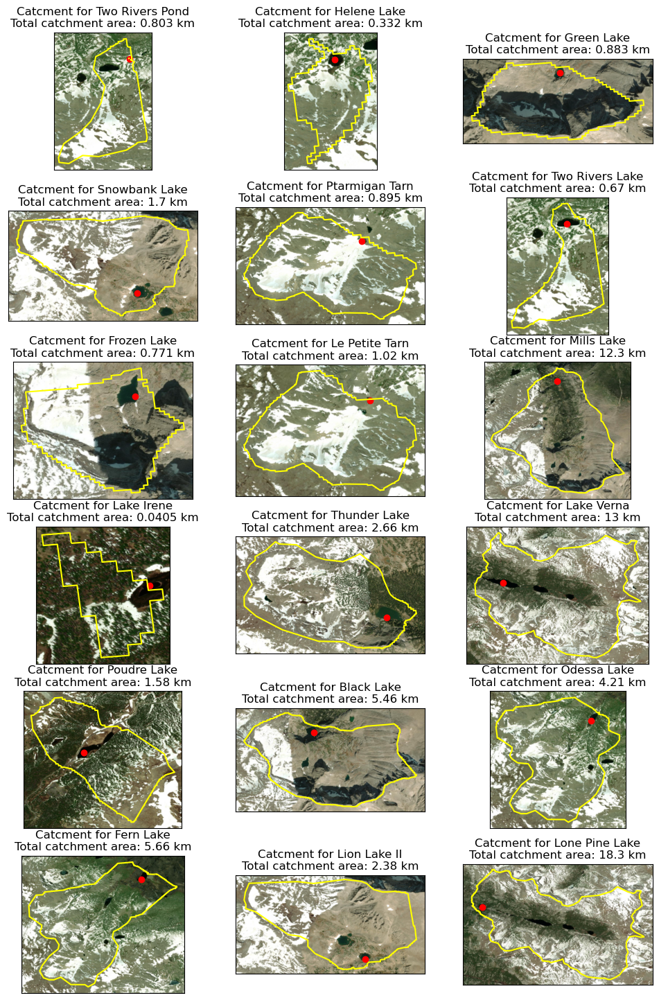

In [7]:
# Plot the Catchment and point data
fig, axes = plt.subplots(6, 3, figsize=(12, 18))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        ax.set(xticks=[], yticks=[], title="Catcment for {}\nTotal catchment area: {:g} km".format(
            lake.name, float('{:.3g}'.format(lake.area/1000000))))
        ctx.add_basemap(ax, crs=lake.catchment.crs.to_string(
        ), source=ctx.providers.Esri.WorldImagery, attribution=False)
        i += 1

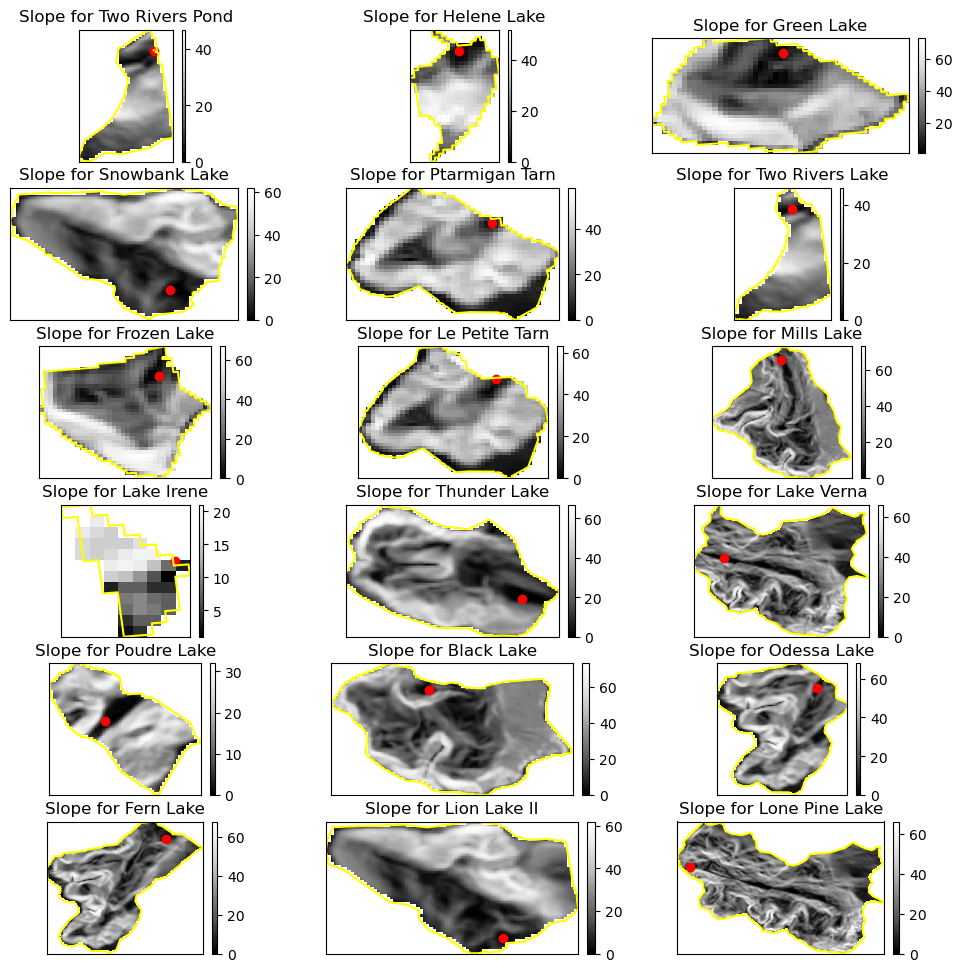

In [8]:
# Plot the slope data
fig, axes = plt.subplots(6, 3, figsize=(12, 12))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        ax.set(title="Slope for {}".format(lake.name))
        extent = plotting_extent(lake.slope.values, lake.slope.rio.transform())
        ep.plot_bands(lake.clean_slope, ax=ax, extent=extent)
        i += 1

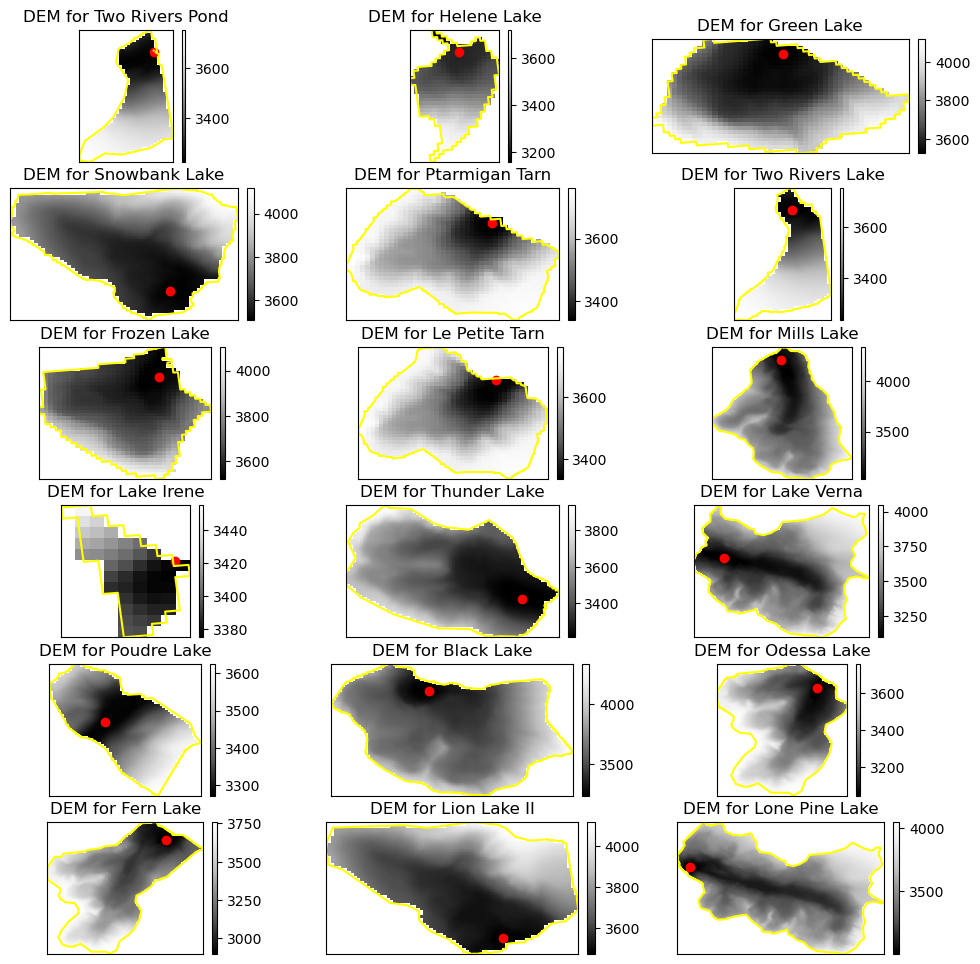

In [9]:
# Plot the dem data
fig, axes = plt.subplots(6, 3, figsize=(12, 12))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        ax.set(title="DEM for {}".format(lake.name))
        extent = plotting_extent(lake.slope.values, lake.slope.rio.transform())
        ep.plot_bands(lake.dem, ax=ax, extent=extent)
        i += 1

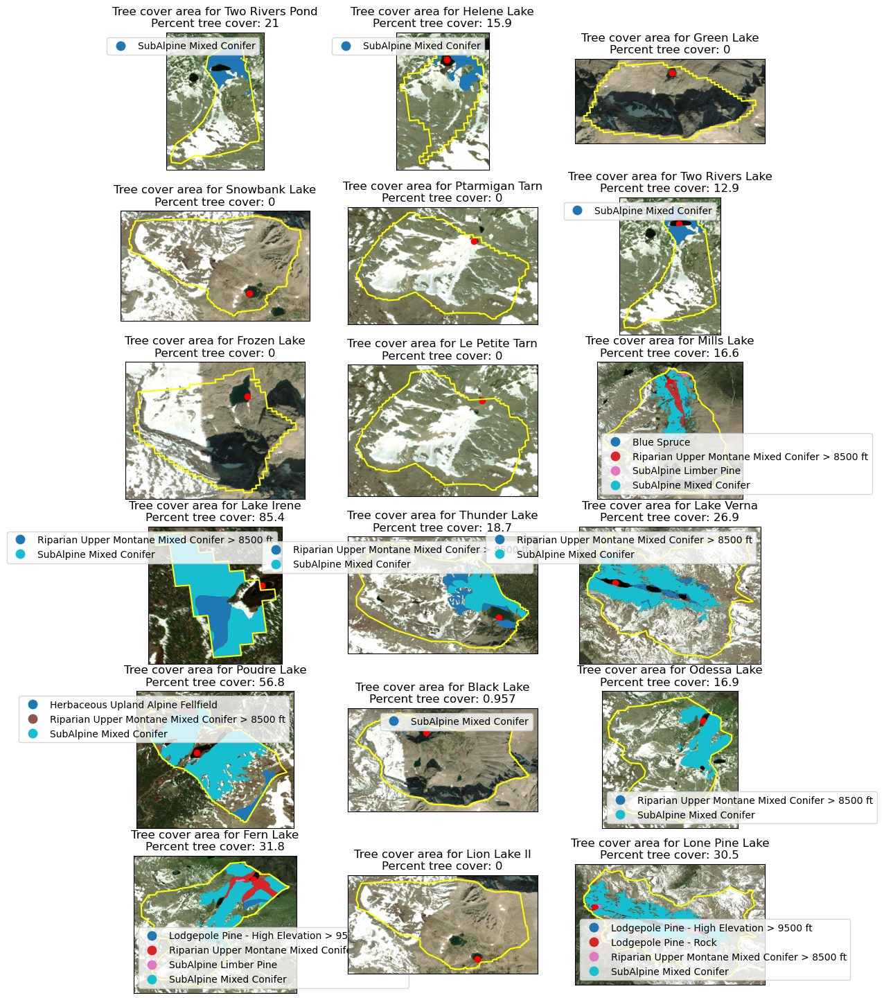

In [10]:
# Plot the tree_cover data
fig, axes = plt.subplots(6, 3, figsize=(12, 18))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        if lake.percent_tree != 0:
            lake.tree_cover.to_crs(lake.catchment.crs).plot(ax=ax, column='cover_type', legend=True)
        ax.set(xticks=[], yticks=[], title="Tree cover area for {}\nPercent tree cover: {:g}".format(
            lake.name, float('{:.3g}'.format(lake.percent_tree))))
        ctx.add_basemap(ax, crs=lake.catchment.crs.to_string(
        ), source=ctx.providers.Esri.WorldImagery, attribution=False)
        i += 1

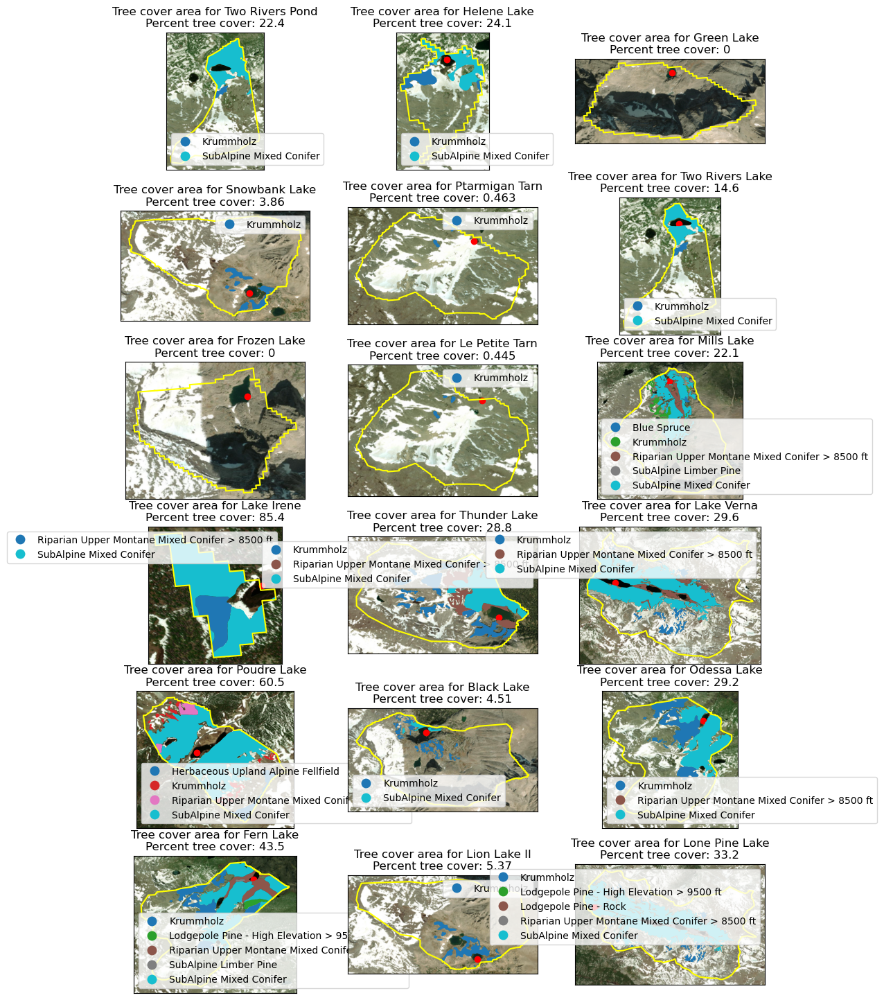

In [11]:
# Plot the tree cover data without krummholz data
fig, axes = plt.subplots(6, 3, figsize=(12, 18))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        if lake.percent_tree_noK != 0:
            lake.tree_cover_noK.to_crs(lake.catchment.crs).plot(ax=ax, column='cover_type', legend=True)
        ax.set(xticks=[], yticks=[], title="Tree cover area for {}\nPercent tree cover: {:g}".format(
            lake.name, float('{:.3g}'.format(lake.percent_tree_noK))))
        ctx.add_basemap(ax, crs=lake.catchment.crs.to_string(
        ), source=ctx.providers.Esri.WorldImagery, attribution=False)
        i += 1

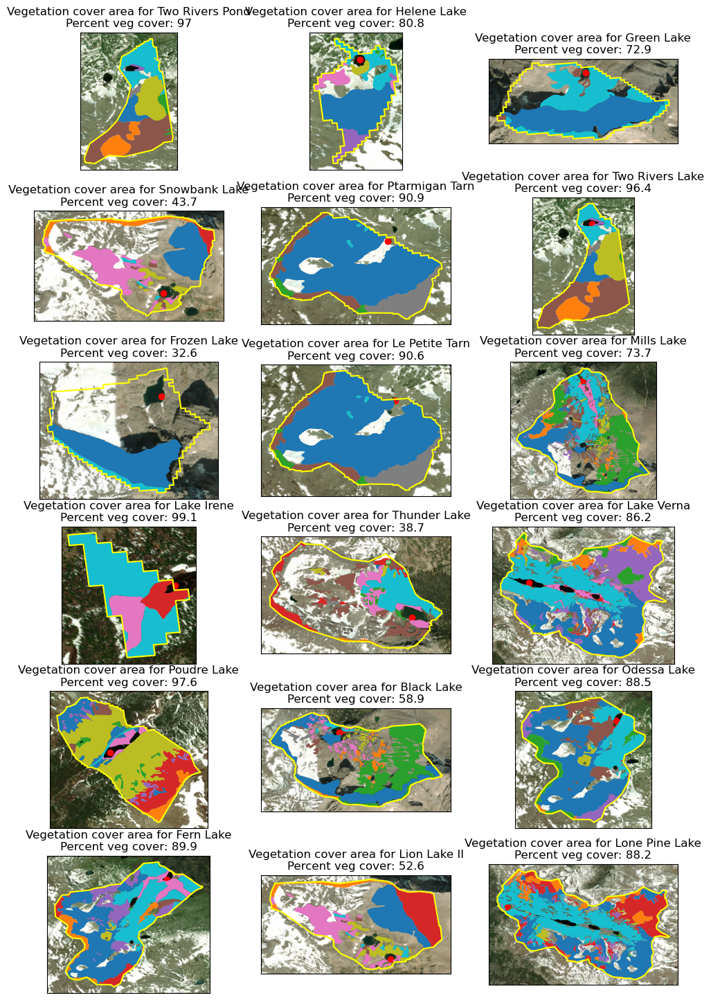

In [12]:
# Plot the veg cover data without krummholz data
fig, axes = plt.subplots(6, 3, figsize=(12, 18))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        if lake.percent_veg != 0:
            lake.veg_cover.to_crs(lake.catchment.crs).plot(ax=ax, column='cover_type')
        ax.set(xticks=[], yticks=[], title="Vegetation cover area for {}\nPercent veg cover: {:g}".format(
            lake.name, float('{:.3g}'.format(lake.percent_veg))))
        ctx.add_basemap(ax, crs=lake.catchment.crs.to_string(
        ), source=ctx.providers.Esri.WorldImagery, attribution=False)
        i += 1

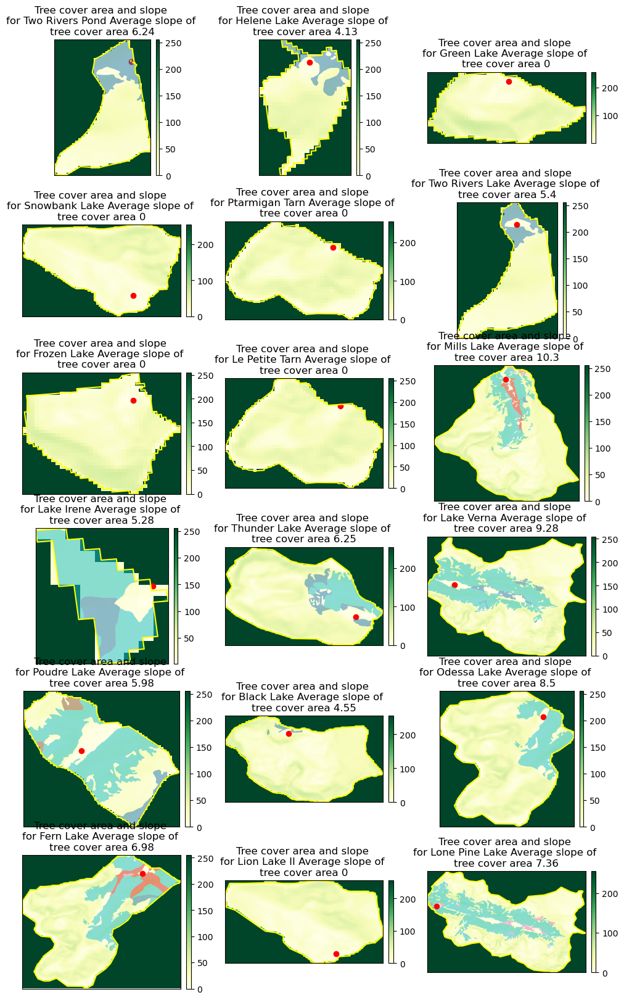

In [13]:
# Plot the tree_cover data over the slope
fig, axes = plt.subplots(6, 3, figsize=(12, 20))
i = 0
for ax_list in axes:
    for ax in ax_list:
        lake = lake_list[i]
        lake.catchment.boundary.plot(ax=ax, color='yellow')
        lake.point.plot(ax=ax, color='red')
        ax.set(title="Tree cover area and slope \nfor {} Average slope of \ntree cover area {:g}".format(
            lake.name, float('{:.3g}'.format(lake.tree_slope))))
        if lake.percent_tree != 0:
            lake.tree_cover.to_crs(lake.catchment.crs).plot(ax=ax, column="cover_type", alpha = .5)
        extent = plotting_extent(lake.slope.values, lake.slope.rio.transform())
        ep.plot_bands(lake.slope, cmap="YlGn", ax=ax, extent=extent, scale=False)
        i += 1

In [14]:
data_df = lake_meta.copy()
lake_area, lake_tree_cover, lake_tree_cover_noK, lake_veg_cover, avg_slope = [], [], [], [], []

new_data_df = pd.DataFrame(columns=['Lake', 'Lake_Area_m2', 'Tree_Cover', 'Trees_noKrumholz_Cover', 'All_Veg_Cover', 'Avg_Tree_Slope'])

for lake in lake_list:
    new_row = {'Lake' : lake.name, 
               'Lake_Area_m2' : lake.area, 
               'Tree_Cover' : lake.percent_tree, 
               'Trees_noKrumholz_Cover': lake.percent_tree_noK, 
               'All_Veg_Cover': lake.percent_veg, 
               'Avg_Tree_Slope': lake.tree_slope}
    new_data_df = pd.concat([new_data_df, pd.DataFrame([new_row])], ignore_index=True)

merged_df = new_data_df.merge(data_df, on='Lake')

In [16]:
merged_df.to_csv(os.path.join(out_dir, 'all_lake_data.csv'))